# Exploratory Data Analysis on Original Data
Notebook to perform preliminar analysis on data on BigQuery.<br>
Data involved are original data copied from CloudSQL, located on BigQuery Dataset SAMPLE_DATA.

### Data Description

Operano 2 diverse tipologie di stazioni:
- <b>una stazione pollini (station_id)</b>: che rileva nella sua locazione la concentrazione e il conteggio per ogni specie di polline nelle 24h precedenti.
- <b>una stazione meteo (arkimet)</b>: che rileva nella sua locazione la temperatura max, min e le precipitazioni nelle 24h precedenti.

In [1]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
from tqdm.auto import tqdm
import json
import calendar
import pandas as pd
import numpy as np
from google.cloud import bigquery
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import ipywidgets as widgets

import warnings
warnings.filterwarnings('ignore')

my_cmap = plt.get_cmap("Paired")

<h3>Config</h3>

In [3]:
# Config

PROJECT_ID = 'arpae-prod-ml'

# BigQuery
BQ_DATASET = 'SAMPLE_DATA'
ANAGRAFICA_TABLES = ['ANAGRAFICA', 'ANAGRAFICA_TO_ARKIMET', 'ANAGRAFICA_TO_METEO']
DATA_TABLES = ['ALL_METEO', 'ARKIMET', 'POLMETEO', 'POL_DAT', 'POL_PREV']
BCODE_SOGLIE_TABLE = "BCODE_SOGLIE"

# Paths
BCODES_PATHS = "data/b_codes.json"

# Const
COMMON_PERIOD_INIT = '2021-05-01'
COMMON_PERIOD_END = '2021-05-07'

# Layout
COLOR_PALETTE = px.colors.qualitative.Prism


<h3>Methods</h3>

In [4]:
# Read Methods

def _run_query(client, query): 
    df = client.query(query).to_dataframe()
    return df

def _read_table(client, project_id, dataset, table):
    query = "SELECT * FROM `{}.{}.{}` ".format(project_id, dataset, table)
    df = _run_query(client, query)
    return df

def _read_table_delta(client, project_id, dataset, table, init, end):
    query = "SELECT * FROM `{}.{}.{}` WHERE reftime > '{}' AND reftime < '{}' ".format(project_id, dataset, table, init, end)
    df = _run_query(client, query)
    df = df.sort_values('reftime')
    return df

def _get_tables_count(client, project_id, dataset, tables):
    tables_cnt = {}
    for table in tqdm(tables):
        try:
            query = "SELECT count(*) FROM `{}.{}.{}` ".format(project_id, dataset, table)
            df = _run_query(client, query)
            cnt = df.loc[0].values[0]
        except Exception as e:
            print(e)
            cnt = 0
        finally:    
            tables_cnt[table] = cnt
    return tables_cnt

def _get_min_max_periods(client, project_id, dataset, tables):
    tables_data_limits = {}
    for table in tqdm(tables):
        query = "SELECT MIN(reftime) AS min, MAX(reftime) AS max FROM `{}.{}.{}` ".format(project_id, dataset, table)
        df = _run_query(client, query)
        tables_data_limits[table] = {'min': df.loc[0]['min'], 'max': df.loc[0]['max']}
    common_period_min = max([tables_data_limits[table]['min'] for table in tables_data_limits.keys()])
    common_period_max = min([tables_data_limits[table]['max'] for table in tables_data_limits.keys()])
    return tables_data_limits, common_period_min, common_period_max

# Plot Methods

def _plot_stations_on_map(df):
    # prepare df
    df_station_poll = df[['station_nome', 'station_lat', 'station_lon']]
    df_station_poll.rename(columns={'station_nome':'name', 'station_lat':'lat', 'station_lon':'lon'}, inplace=True)
    df_station_poll['type'] = 'polline'
    df_station_ark = anagrafica_arkimet_meteo_df[['arkimet_id', 'arkimet_lat', 'arkimet_lon']]
    df_station_ark.rename(columns={'arkimet_id':'name', 'arkimet_lat':'lat', 'arkimet_lon':'lon'}, inplace=True)
    df_station_ark['type'] = 'meteo'
    df_station = pd.concat([df_station_poll, df_station_ark])
    df_station.drop_duplicates(inplace=True)
    df_station.dropna(inplace=True)
    df_station['name'] = df_station['name'].apply(lambda x: x.replace(' urbana', ''))    
    # plot
    fig = go.Figure()
    fig = px.scatter_geo(title="Polline & Arkimet Stations",
                         data_frame=df_station, 
                         lat='lat', lon='lon',    
                         color='name',
                         scope='europe',
                         color_discrete_sequence=COLOR_PALETTE,
                         width=1200,
                         height=600)
    fig.show() 

def _plot_h(df):
    fig = go.Figure()
    fig = px.scatter(title="H road & H mslm",
                     x=df['station_H_piano_strada'], 
                     y=df['station_H_mslm'],
                     template="simple_white",
                     width=1200, height=600)
    fig.update_traces(marker=dict(size=20))
    fig.update_xaxes(title_text='H piano strada', showgrid=True)
    fig.update_yaxes(title_text='H mslm', showgrid=True)
    fig.show()
    
def _plot_tables_count(tables_cnt):
    fig = go.Figure()
    fig = px.histogram(title="Data Tables Count",
                       x=tables_cnt.keys(),
                       y=tables_cnt.values(),
                       color=tables_cnt.keys(),
                       color_discrete_sequence=COLOR_PALETTE,
                       template="simple_white",
                       width=1200, height=500)
    fig.update_xaxes(title_text='Table', showgrid=True)
    fig.update_yaxes(title_text='Count', showgrid=True)
    fig.show()
    

def _plot_periods(tables_data_limits):
    # prepare df
    df = pd.DataFrame(tables_data_limits).T.reset_index().rename(columns={'index':'table'})
    df1 = df[['table', 'max']].rename(columns={'max':'val'})
    df2 = df[['table', 'min']].rename(columns={'min':'val'})
    df_conc = pd.concat([df1, df2])
    # plot
    fig = go.Figure()
    fig = px.scatter(title="Data Period Limits, common period: ({} - {})".format(str(df['min'].max())[:10], str(df['max'].min())[:10]),
                     data_frame=df_conc,
                     x='val',
                     y='table',
                     color='table',
                     color_discrete_sequence=COLOR_PALETTE,
                     template="simple_white",
                     width=1200, height=500)
    fig.add_vrect(x0=df['min'].max(), x1=df['max'].min(), line_width=0, fillcolor="green", opacity=0.2)
    fig.update_traces(marker=dict(size=6), mode="markers+lines")
    fig.update_xaxes(title_text='Table', showgrid=True)
    fig.update_yaxes(title_text='Period', showgrid=True)
    fig.show()

def _plot_data_values(df_name, df, const_cols, var_col):
    # print enums values
    for col in const_cols:
        print("Values for {}: {}".format(col, [x for x in df[col].unique()]))
    # plot
    fig = go.Figure()
    fig = px.scatter(title="{} Trend".format(df_name),
                     data_frame=df,
                     x='reftime',
                     y='value',
                     color=var_col,
                     color_discrete_sequence=COLOR_PALETTE,
                     template="simple_white",
                     width=1200, height=400)
    fig.update_traces(marker=dict(size=4), mode="markers")
    fig.update_xaxes(title_text='datetime', showgrid=False)
    fig.update_yaxes(title_text='value', showgrid=False)
    fig.show()
    
def _plot_value_distr(df_name, df, var_col):
    fig = go.Figure()
    fig = px.histogram(title=df_name,
                       data_frame=df,
                       x='value',
                       color=var_col,
                       color_discrete_sequence=COLOR_PALETTE,
                       template="simple_white",
                       width=1200, height=500)
    fig.update_xaxes(title_text='distr', showgrid=True)
    fig.update_yaxes(title_text='count', showgrid=True)
    fig.show()
    

<h3>1. Config</h3>

<h4>1.1 Config BigQuery</h4>

In [5]:
# Setup Client

bq_client = bigquery.Client()
bq_client

<h3>2. Read Data</h3>

<h4>2.1 Load b_codes from json file</h4>
<h5>Data has been collected at <a href=https://arpa-simc.github.io/dballe/general_ref/btable.html>https://arpa-simc.github.io/dballe/general_ref/btable.html</a></h5>

In [6]:
# Read BCodes

b_codes = json.load(open(BCODES_PATHS))[0]
print("Found {} Codes".format(len(b_codes)))

Found 601 Codes


<h4>2.2 Read Stats from tables</h4>

In [7]:
# Read Count for each table

tables_cnt = _get_tables_count(bq_client, PROJECT_ID, BQ_DATASET, DATA_TABLES)

  0%|          | 0/5 [00:00<?, ?it/s]

In [8]:
# Read Min, Max Timestamp foreach table

tables_data_limits, common_period_min, common_period_max = _get_min_max_periods(bq_client, PROJECT_ID, BQ_DATASET, DATA_TABLES)
print("Common period: from {} to {}.".format(str(common_period_min)[:10], str(common_period_max)[:10]))

  0%|          | 0/5 [00:00<?, ?it/s]

Common period: from 2010-03-02 to 2021-12-31.


<h4>2.3 Read b_codes thresholds from table</h4>

In [9]:
# Load BCODE_SOGLIE

b_codes_soglie = _read_table(bq_client, PROJECT_ID, BQ_DATASET, BCODE_SOGLIE_TABLE)
b_codes_soglie.head(3)

,b_code,basso,medio,alto,CAL_01_JAN,CAL_02_FEB,CAL_03_MAR,CAL_04_APR,CAL_05_MAY,CAL_06_JUN,CAL_07_JUL,CAL_08_AUG,CAL_09_SEP,CAL_10_OCT,CAL_11_NOV,CAL_12_DEC
0,B48066,0.0,0.0,0,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
1,B48081,3.0,25.0,50,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
2,B48082,3.0,25.0,50,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>


<h4>2.3 Read Data from Anagrafica tables</h4>

<b>Anagrafica</b> contiene le informazioni delle stazioni di rilevazione di pollini:
- station_id: id della stazione di rilevazione di pollini
- id_gepo: id della stazione (arkimet?) dei pollini più vicina a quella stazione (usato come riferimento nelle tabelle sui pollini) 
- Nome: Nome della stazione
- Lat, Lon: coordinate
- H_piano_strada, H_mslm: altezza della stazione

In [10]:
# Read anagrafica Table

anagrafica_df = _read_table(bq_client, PROJECT_ID, BQ_DATASET, "ANAGRAFICA")
print(anagrafica_df.shape)
anagrafica_df.head(3)

(16, 7)


,station_id,id_gepo,Nome,Lat,Lon,H_piano_strada,H_mslm
0,9,4185,Ravenna,44.4108,12.1908,2.0,23.0
1,11,4188,Rimini,44.0450,12.5914,7.0,28.0
2,4,4182,Ferrara,44.8103,11.5876,8.0,29.0


<b>AnagraficaToArkimet</b>: Per ogni stazione di pollini (station_id), ad eccezione di 4 casi, si mappa la stazione meteo arkimet più vicina, con i seguenti campi:
- station_id: id della stazione di pollini
- arkimet_id: id della stazione meteo più vicina
- lat, lon: coordinate della stazione meteo

In [11]:
# Read anagraficaToArkimet Table

anagraficaToArkimet_df = _read_table(bq_client, PROJECT_ID, BQ_DATASET, "ANAGRAFICA_TO_ARKIMET")
print(anagraficaToArkimet_df.shape)
anagraficaToArkimet_df.head(3)

(11, 4)


,station_id,arkimet_id,lat,lon
0,1,Bologna urbana,44.5008,11.3288
1,2,Cesena urbana,44.1382,12.2436
2,4,Ferrara urbana,44.8325,11.6211


<b>anagraficaToMeteo</b>: Per ogni stazione meteo (station_id) mappa il meteo_id (dove viene usato?)

In [12]:
# Read anagraficaToMeteo Table

anagraficaToMeteo_df = _read_table(bq_client, PROJECT_ID, BQ_DATASET, "ANAGRAFICA_TO_METEO")
anagraficaToMeteo_df.station_id = anagraficaToMeteo_df.station_id.astype('int64')
print(anagraficaToMeteo_df.shape)
anagraficaToMeteo_df.head(3)

(14, 2)


,station_id,meteo_id
0,1,01421
1,2,01989
2,3,01786


<h4>2.4 Read Sample Data from tables</h4>

Read last sample of a defined common period to have some overlap.

<b>AllMeteo</b> contiene le rilevazioni sul meteo sia sulle var che su temperature e precipitazioni:
- station_id: id della stazione meteo
- var_id: variabile rilevata, indicata da codice <a href="https://arpa-simc.github.io/dballe/general_ref/btable.html">qui</a>
- reftime: timestamp della rilevazione
- timerange0, timerange2: secondi tra ogni rilevazione
- value: valore rilevato (la temperatura qui è in Kelvin e va convertita)

In [13]:
# Read ALL_METEO Table

allMeteo_df = _read_table_delta(bq_client, PROJECT_ID, BQ_DATASET, "ALL_METEO", COMMON_PERIOD_INIT, COMMON_PERIOD_END)
print(allMeteo_df.shape)
allMeteo_df.head(3)

(8251, 6)


,station_id,var_id,reftime,timerange0,timerange2,value
7492,6,B13011,2021-05-01 00:15:00+00:00,1,900,0.0
6419,8,B13011,2021-05-01 00:15:00+00:00,1,900,0.0
2317,5,B13011,2021-05-01 00:15:00+00:00,1,900,0.0


<b>Arkimet</b> contiene le rilevazioni sulle variabili del meteo:
- arkimet_id: Nome della stazione meteo
- arkimetvar: variabile rilevata, indicata da codice <a href="https://arpa-simc.github.io/dballe/general_ref/btable.html">qui</a>
- reftime: timestamp della rilevazione
- timerange0, timerange2: secondi tra ogni rilevazione
- value: valore rilevato (la temperatura qui è in Kelvin e va convertita)

In [14]:
# Read Arkimet data

arkimet_df = _read_table_delta(bq_client, PROJECT_ID, BQ_DATASET, "ARKIMET", COMMON_PERIOD_INIT, COMMON_PERIOD_END)
arkimet_df["arkimetvar_descr"] = arkimet_df.arkimetvar.map(b_codes)
print(arkimet_df.shape)
arkimet_df.head(3)

(8041, 7)


,arkimet_id,arkimetvar,reftime,timerange0,timerange2,value,arkimetvar_descr
7878,Reggio nell'Emilia urbana,B13011,2021-05-01 00:15:00+00:00,1,900,0.0,"TOTAL PRECIPITATION / TOTAL WATER EQUIVALENT, ..."
2643,Ravenna urbana,B13011,2021-05-01 00:15:00+00:00,1,900,0.0,"TOTAL PRECIPITATION / TOTAL WATER EQUIVALENT, ..."
4628,Bologna urbana,B13011,2021-05-01 00:15:00+00:00,1,900,0.0,"TOTAL PRECIPITATION / TOTAL WATER EQUIVALENT, ..."


<b>Poldata</b>: contiene le rilevazioni sui pollini:
- id_gepo: id della stazione (gepo) che effettua la rilevazione
- variable_id: variabile rilevata, indicata da codice qui
- reftime: timestamp della rilevazione
- value: valore rilevato
- modified: numero di volte in cui il valore è stato manualmente modificato


In [15]:
# Read POL_DAT Table

poldat_df = _read_table_delta(bq_client, PROJECT_ID, BQ_DATASET, "POL_DAT", COMMON_PERIOD_INIT, COMMON_PERIOD_END)
poldat_df.rename(columns={'station_id':'id_gepo'}, inplace=True)
poldat_df['variable_descr'] = poldat_df['variable_id'].map(b_codes)
print(poldat_df.shape)
poldat_df.head(3)

(5070, 6)


,id_gepo,variable_id,reftime,value,modified,variable_descr
0,4176,B48001,2021-05-02 00:00:00+00:00,263.34,None,"Graminacee_Graminacee indistinte, POLLEN/M**3"
1642,4189,B48001,2021-05-02 00:00:00+00:00,251.12,None,"Graminacee_Graminacee indistinte, POLLEN/M**3"
1638,4188,B48209,2021-05-02 00:00:00+00:00,4.00,None,"Conta Moracee - Morus, Numeric"


<b>Polmeteo</b>: contiene le rileveazioni metereologiche (temperature e precipitazioni):
- meteo_id: id associato alla stazione meteo della misurazione
- meteovar_id: indica la variabile rilevata (tmix, tmax, precipitazione giornaliera)
- reftime: indica il timestamp della rilevazione
- value: indica il valore

In [16]:
# Read POLMETEO Table

polmeteo_df = _read_table_delta(bq_client, PROJECT_ID, BQ_DATASET, "POLMETEO", COMMON_PERIOD_INIT, COMMON_PERIOD_END)
print(polmeteo_df.shape)
polmeteo_df.head(3)

(210, 4)


,meteo_id,meteovar_id,reftime,value
104,01573,TMAX,2021-05-02 00:00:00+00:00,21.9
175,01221,TMIN,2021-05-02 00:00:00+00:00,10.7
37,01618,PREC,2021-05-02 00:00:00+00:00,0.0


<b>Polprev</b>: contiene le previsioni lette 1 settimana prima:
- station_id: id della stazione di polline su cui è avvenuta la previsione
- variable_id: id della variabile rilevata
- reftime: timestamp della rilevazione
- value: valore rilevato
- modified: indica quante volte il valore è stato modificato

In [17]:
# Read POL_PREV Table

polprev_df = _read_table_delta(bq_client, PROJECT_ID, BQ_DATASET, "POL_PREV", COMMON_PERIOD_INIT, COMMON_PERIOD_END)
print(polprev_df.shape)
polprev_df.head(3)

(782, 5)


,station_id,variable_id,reftime,value,modified
0,4176,B48001,2021-05-02 00:00:00+00:00,90.2,None
352,4189,B48039,2021-05-02 00:00:00+00:00,44.6,None
361,4190,B48001,2021-05-02 00:00:00+00:00,136.1,None


<h3>3. Join Tables</h3>

<h4>3.1 Join Anagrafica Tables</h4>

In [18]:
# Join Anagrafica Tables

anagrafica_df.rename(columns={'Nome':'station_nome',
                              'Lat':'station_lat',
                              'Lon':'station_lon',
                              'H_piano_strada':'station_H_piano_strada',
                              'H_mslm':'station_H_mslm'}, 
                     inplace=True)

anagraficaToArkimet_df.rename(columns={'lat':'arkimet_lat',
                                       'lon':'arkimet_lon' },
                             inplace=True)

anagrafica_arkimet_meteo_df = pd.merge(anagrafica_df, anagraficaToArkimet_df, how='left', on='station_id')
anagrafica_arkimet_meteo_df = pd.merge(anagrafica_arkimet_meteo_df, anagraficaToMeteo_df, on='station_id')
anagrafica_arkimet_meteo_df.sort_values('station_id', inplace=True)
anagrafica_arkimet_meteo_df.head(3)

,station_id,id_gepo,station_nome,station_lat,station_lon,station_H_piano_strada,station_H_mslm,arkimet_id,arkimet_lat,arkimet_lon,meteo_id
9,1,4181,Bologna,44.4914,11.3694,80.0,101.0,Bologna urbana,44.5008,11.3288,01421
6,2,4187,Cesena,44.1346,12.2587,31.0,52.0,Cesena urbana,44.1382,12.2436,01989
11,3,4184,Faenza,44.2885,11.8738,37.0,58.0,NaN,NaN,NaN,01786


<h4>3.2 Join Data Tables</h4>

In [19]:
# Join All Meteo

allMeteo_df = pd.merge(anagrafica_arkimet_meteo_df, allMeteo_df, on='station_id')
print(allMeteo_df.shape)
allMeteo_df.head(3)

(8251, 16)


,station_id,id_gepo,station_nome,station_lat,station_lon,station_H_piano_strada,station_H_mslm,arkimet_id,arkimet_lat,arkimet_lon,meteo_id,var_id,reftime,timerange0,timerange2,value
0,1,4181,Bologna,44.4914,11.3694,80.0,101.0,Bologna urbana,44.5008,11.3288,01421,B13011,2021-05-01 00:15:00+00:00,1,900,0.0
1,1,4181,Bologna,44.4914,11.3694,80.0,101.0,Bologna urbana,44.5008,11.3288,01421,B13011,2021-05-01 00:30:00+00:00,1,900,0.0
2,1,4181,Bologna,44.4914,11.3694,80.0,101.0,Bologna urbana,44.5008,11.3288,01421,B13011,2021-05-01 00:45:00+00:00,1,900,0.0


In [20]:
# Join All Meteo

arkimet_df = pd.merge(anagrafica_arkimet_meteo_df, arkimet_df, on='arkimet_id')
print(arkimet_df.shape)
arkimet_df.head(3)

(8041, 17)


,station_id,id_gepo,station_nome,station_lat,station_lon,station_H_piano_strada,station_H_mslm,arkimet_id,arkimet_lat,arkimet_lon,meteo_id,arkimetvar,reftime,timerange0,timerange2,value,arkimetvar_descr
0,1,4181,Bologna,44.4914,11.3694,80.0,101.0,Bologna urbana,44.5008,11.3288,01421,B13011,2021-05-01 00:15:00+00:00,1,900,0.0,"TOTAL PRECIPITATION / TOTAL WATER EQUIVALENT, ..."
1,1,4181,Bologna,44.4914,11.3694,80.0,101.0,Bologna urbana,44.5008,11.3288,01421,B13011,2021-05-01 00:30:00+00:00,1,900,0.0,"TOTAL PRECIPITATION / TOTAL WATER EQUIVALENT, ..."
2,1,4181,Bologna,44.4914,11.3694,80.0,101.0,Bologna urbana,44.5008,11.3288,01421,B13011,2021-05-01 00:45:00+00:00,1,900,0.0,"TOTAL PRECIPITATION / TOTAL WATER EQUIVALENT, ..."


In [21]:
# Join Pol Meteo

polmeteo_df = pd.merge(anagrafica_arkimet_meteo_df, polmeteo_df, on='meteo_id')
print(polmeteo_df.shape)
polmeteo_df.head(3)

(210, 14)


,station_id,id_gepo,station_nome,station_lat,station_lon,station_H_piano_strada,station_H_mslm,arkimet_id,arkimet_lat,arkimet_lon,meteo_id,meteovar_id,reftime,value
0,1,4181,Bologna,44.4914,11.3694,80.0,101.0,Bologna urbana,44.5008,11.3288,01421,TMAX,2021-05-02 00:00:00+00:00,21.7
1,1,4181,Bologna,44.4914,11.3694,80.0,101.0,Bologna urbana,44.5008,11.3288,01421,PREC,2021-05-02 00:00:00+00:00,0.0
2,1,4181,Bologna,44.4914,11.3694,80.0,101.0,Bologna urbana,44.5008,11.3288,01421,TMIN,2021-05-02 00:00:00+00:00,13.3


In [22]:
# Join Pol Dat

poldat_df = pd.merge(anagrafica_arkimet_meteo_df, poldat_df, on='id_gepo')
print(poldat_df.shape)
poldat_df.head(3)

(5070, 16)


,station_id,id_gepo,station_nome,station_lat,station_lon,station_H_piano_strada,station_H_mslm,arkimet_id,arkimet_lat,arkimet_lon,meteo_id,variable_id,reftime,value,modified,variable_descr
0,1,4181,Bologna,44.4914,11.3694,80.0,101.0,Bologna urbana,44.5008,11.3288,01421,B48166,2021-05-02 00:00:00+00:00,27.0,None,"Conta Spore fungine_Alternaria, Numeric"
1,1,4181,Bologna,44.4914,11.3694,80.0,101.0,Bologna urbana,44.5008,11.3288,01421,B48164,2021-05-02 00:00:00+00:00,16.0,None,"Conta Juglandacee_Juglandacee indistinte, Numeric"
2,1,4181,Bologna,44.4914,11.3694,80.0,101.0,Bologna urbana,44.5008,11.3288,01421,B48160,2021-05-02 00:00:00+00:00,4.0,None,"Conta Salicacee_Salice comune, Numeric"


<h3>3. Anagrafica Tables Analysis</h3>

In [23]:
# Show Names

anagrafica_arkimet_meteo_df[['station_nome', 'arkimet_id']]

,station_nome,arkimet_id
9,Bologna,Bologna urbana
6,Cesena,Cesena urbana
11,Faenza,NaN
2,Ferrara,Ferrara urbana
5,Forlì,Forli' urbana
4,Modena,Modena urbana
8,Parma,Parma urbana
12,Piacenza,Piacenza urbana
0,Ravenna,Ravenna urbana
13,Reggio Emilia,Reggio nell'Emilia urbana


In [24]:
# Show Stations on Map

_plot_stations_on_map(anagrafica_arkimet_meteo_df)

In [25]:
# H road & H mslm
    
_plot_h(anagrafica_arkimet_meteo_df)

<h3>4. Data Tables Stats Analysis</h3>

In [26]:
# Plot tables count

_plot_tables_count(tables_cnt)

In [27]:
# Plot Period Limits

_plot_periods(tables_data_limits)

<h3>5. Data Tables Values Analysis</h3>

Since ALL_METEO contains both data from ARKIMET and POLMETEO, we could plot only ALL_METEO.<br>
POLDAT contains data from pol.

<h4>5.1 Time Series</h4>

In [28]:
# Plot

_plot_data_values('allMeteo_df', allMeteo_df, ['timerange0', 'timerange2'], 'var_id')
_plot_data_values('poldat_df', poldat_df, [], 'variable_id')

Values for timerange0: [1, 0]
Values for timerange2: [900, 3600, 86400]


<h4>5.2 Distribution</h4>

In [29]:
# Plot Values Distr
    
_plot_value_distr('ALL_METEO', allMeteo_df, 'var_id')
_plot_value_distr('POL_DAT', poldat_df, 'variable_id')

<h2>6. Select Species</h3>

### 6.1 Load all collected pollen data

In [30]:
poldat_df = _read_table(bq_client, PROJECT_ID, BQ_DATASET, "POL_DAT")
poldat_df.rename(columns={'station_id':'id_gepo'}, inplace=True)
poldat_df['variable_descr'] = poldat_df['variable_id'].map(b_codes)
print(poldat_df.shape)
poldat_df.head(3)

(5088857, 6)


,id_gepo,variable_id,reftime,value,modified,variable_descr
0,1,B48002,2021-08-26 00:00:00+00:00,36.96,2,"Betulacee_Ontano nero, POLLEN/M**3"
1,1,B48031,2021-08-23 00:00:00+00:00,5.60,2,"Aceraceae_Aceracee indistinte, POLLEN/M**3"
2,4177,B48018,2022-08-02 00:00:00+00:00,0.80,5,"Plantaginacee_Plantaginacee indistinte, POLLEN..."


### 6.1 Join pollen data and thresholds

In [31]:
poldat_df = pd.merge(poldat_df, b_codes_soglie, how="left", left_on="variable_id", right_on="b_code")

print(poldat_df.shape)
poldat_df.head(3)

(5088857, 22)


,id_gepo,variable_id,reftime,value,modified,variable_descr,b_code,basso,medio,alto,...,CAL_03_MAR,CAL_04_APR,CAL_05_MAY,CAL_06_JUN,CAL_07_JUL,CAL_08_AUG,CAL_09_SEP,CAL_10_OCT,CAL_11_NOV,CAL_12_DEC
0,1,B48002,2021-08-26 00:00:00+00:00,36.96,2,"Betulacee_Ontano nero, POLLEN/M**3",B48002,1.0,16.0,50,...,True,True,True,True,True,True,False,False,False,True
1,1,B48031,2021-08-23 00:00:00+00:00,5.60,2,"Aceraceae_Aceracee indistinte, POLLEN/M**3",B48031,1.0,20.0,40,...,True,True,True,True,True,True,False,True,False,False
2,4177,B48018,2022-08-02 00:00:00+00:00,0.80,5,"Plantaginacee_Plantaginacee indistinte, POLLEN...",B48018,0.1,0.5,2,...,True,True,True,True,True,True,True,True,True,False


In [32]:
# # to_datetime
poldat_df.date = pd.to_datetime(poldat_df.reftime)

### 6.2 Analyzing species collected data time ranges

In [33]:
# Collect date min/max for each specie
view = poldat_df.groupby("variable_id")["reftime"].agg([min, max])
view = view.reset_index()
view.sort_values(["max", "min"], inplace=True)
view.sample(3)

,variable_id,min,max
77,B48142,2017-09-26 00:00:00+00:00,2023-02-05 00:00:00+00:00
7,B48008,1998-01-02 00:00:00+00:00,2023-02-05 00:00:00+00:00
2,B48003,1998-01-02 00:00:00+00:00,2023-02-05 00:00:00+00:00


In [34]:
data = []
for _, row in view.iterrows():
    data.append(go.Scatter(
        x=[row['min'], row['max']],
        y=[row['variable_id'], row['variable_id']],
        mode='lines',
        name=row['variable_id'],
        showlegend=True
    ))

layout = go.Layout(title='Collected data for specie over time', xaxis=dict(title='Time'), yaxis=dict(title='Specie ID'))
fig = go.Figure(data=data, layout=layout)
fig.update_traces(marker=dict(size=6), mode="markers+lines")
fig.show()

In [35]:
data.append(go.Scatter(
    x=["2016-01-01", "2016-01-01"],
    y=[view['variable_id'].iloc[0], view['variable_id'].iloc[-1]],
    mode='lines',
    line=dict(color='red'),
    name="Threshold"
))

layout = go.Layout(title='Collected data for specie over time', xaxis=dict(title='Time'), yaxis=dict(title='Specie ID'))
fig = go.Figure(data=data, layout=layout)
fig.update_traces(marker=dict(size=6), mode="markers+lines")
fig.show()

In [36]:
# Define specie date ranges
year_max_threshold = 2016
year_min_threshold = 2020

In [37]:
# Convert to datetime and filter species id
specie_date_ranges = poldat_df.groupby("variable_id")["reftime"].agg([min, max]).reset_index()

specie_date_ranges = specie_date_ranges[specie_date_ranges["min"].dt.year < year_max_threshold]
specie_date_ranges = specie_date_ranges[specie_date_ranges["max"].dt.year > year_min_threshold]
print(f"{len(specie_date_ranges.index)} species selected.")
specie_date_ranges

33 species selected.


,variable_id,min,max
0,B48001,1998-01-02 00:00:00+00:00,2023-02-05 00:00:00+00:00
1,B48002,1998-01-02 00:00:00+00:00,2023-02-05 00:00:00+00:00
2,B48003,1998-01-02 00:00:00+00:00,2023-02-05 00:00:00+00:00
4,B48005,1998-01-02 00:00:00+00:00,2023-02-05 00:00:00+00:00
5,B48006,1998-01-02 00:00:00+00:00,2023-02-05 00:00:00+00:00
6,B48007,1987-03-03 00:00:00+00:00,2023-02-05 00:00:00+00:00
7,B48008,1998-01-02 00:00:00+00:00,2023-02-05 00:00:00+00:00
10,B48011,1998-01-02 00:00:00+00:00,2023-02-05 00:00:00+00:00
11,B48012,1998-01-02 00:00:00+00:00,2023-02-05 00:00:00+00:00
12,B48013,1998-01-02 00:00:00+00:00,2023-02-05 00:00:00+00:00


### 6.3 Update support table

In [38]:
# for specie_id in specie_date_ranges.variable_id:
#     sql = f"UPDATE `arpae-prod-ml.SAMPLE_DATA.B_CODES` SET eligible=true WHERE var_id = \"{specie_id}\";"
#     print(sql)

In [39]:
print(poldat_df.shape)
poldat_df = poldat_df[poldat_df.variable_id.isin(specie_date_ranges.variable_id.values)]
poldat_df.reset_index(drop=True, inplace=True)
print(poldat_df.shape)

(5088857, 22)
(3559394, 22)


<h2>7. Calendar</h2>

In [40]:
poldat_df["year"] = poldat_df.reftime.dt.year
poldat_df["month"] = poldat_df.reftime.dt.month
poldat_df["day"] = poldat_df.reftime.dt.day
poldat_df[["year", "month", "day"]].head(3)

,year,month,day
0,2021,8,26
1,2021,8,23
2,2022,8,2


## 7.1 Creating calendar using percentile analysis

In [41]:
sample_id = np.random.choice(poldat_df.variable_id)
sample_id

'B48039'

In [42]:
view = poldat_df[poldat_df.variable_id == sample_id]
view = view[["year", "month", "day", "value", "basso", "medio"]]

print(view.shape)
view.head(3)

(109274, 6)


,year,month,day,value,basso,medio
9,2022,8,1,666.8,1.0,10.0
10,2022,8,3,386.8,1.0,10.0
11,2022,8,6,609.2,1.0,10.0


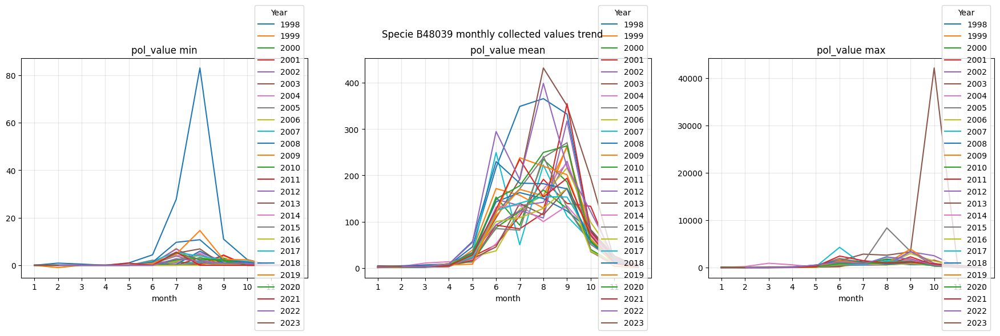

In [43]:
### Specie monthly correlation
f, axs = plt.subplots(1, 3, figsize=(22,5), sharex=True)
f.suptitle(f"Specie {sample_id} monthly collected values trend")

pivot_table = pd.pivot_table(view, values='value', index='month', columns='year', aggfunc=np.min)
pivot_table.plot(kind='line', ax=axs[0], title="pol_value min");

pivot_table = pd.pivot_table(view, values='value', index='month', columns='year', aggfunc=np.mean)
pivot_table.plot(kind='line', ax=axs[1], title="pol_value mean");

pivot_table = pd.pivot_table(view, values='value', index='month', columns='year', aggfunc=np.max)
pivot_table.plot(kind='line', ax=axs[2], title="pol_value max");

[ax.grid(alpha=.3) for ax in axs]
[ax.set_xticks(range(1,13)) for ax in axs]
[ax.legend(title="Year", loc="center right") for ax in axs]
plt.show();

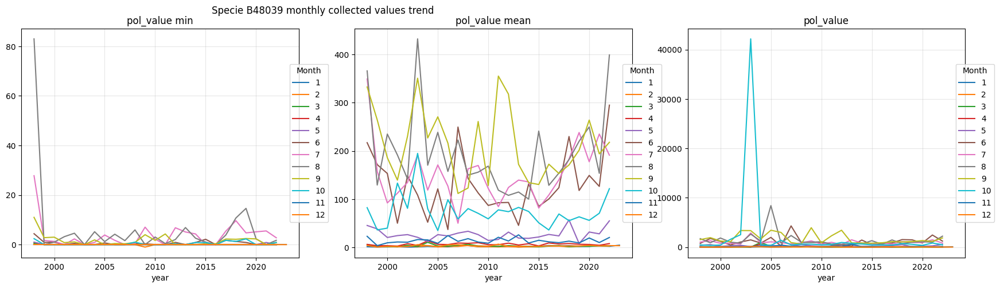

In [44]:
### Specie monthly correlation
f, axs = plt.subplots(1, 3, figsize=(14,5), sharex=True)
f.suptitle(f"Specie {sample_id} monthly collected values trend")

pivot_table = pd.pivot_table(view, values='value', index='year', columns='month', aggfunc=np.min)
pivot_table.plot(kind='line', ax=axs[0], title="pol_value min");

pivot_table = pd.pivot_table(view, values='value', index='year', columns='month', aggfunc=np.mean)
pivot_table.plot(kind='line', ax=axs[1], title="pol_value mean");

pivot_table = pd.pivot_table(view, values='value', index='year', columns='month', aggfunc=np.max)
pivot_table.plot(kind='line', ax=axs[2], title="pol_value");

[ax.grid(alpha=.3) for ax in axs]
# [ax.set_xticks(range(view.year.min(), view.year.max()+1,2)) for ax in axs]
[ax.legend(title="Month", loc="center right", bbox_to_anchor=(1.12, .5), ncol=1) for ax in axs]
plt.subplots_adjust(bottom=.1, right=1.3, top=.9)
plt.show();

year,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
month,,,,,,,,,,,,,,,,,,,,,
1,1.460000,0.722980,1.193916,1.589033,0.668311,1.012109,2.032857,1.443495,1.243618,3.512941,...,1.864470,1.946942,3.991891,2.534077,3.728747,1.931468,2.140311,3.191385,2.285727,4.629705
2,4.764706,1.483939,1.837793,1.065223,3.285399,1.485084,3.440296,1.042577,1.908519,2.044947,...,1.271700,1.157135,3.131689,2.572317,1.532197,2.256333,3.160532,3.622403,3.651686,3.542800
3,5.918333,2.250452,1.881090,1.866484,4.244119,1.950354,10.558664,2.927840,2.657494,4.223893,...,2.072382,1.499974,2.577021,3.619751,1.564491,2.437519,2.325170,3.310348,2.498693,NaN
4,6.250000,3.497667,3.639939,2.758991,7.643307,4.227164,13.410571,6.398130,5.826998,9.151972,...,7.625486,3.090707,9.282225,6.976481,8.064492,6.527787,6.091090,4.388625,7.894474,NaN
5,45.459677,38.361677,20.541056,24.427823,26.466546,20.883041,12.062535,26.446063,23.786675,29.662051,...,18.781066,21.593753,26.863641,23.833383,57.084828,8.031128,31.892733,28.111439,55.059147,NaN
6,217.062264,171.579933,153.210368,50.116282,148.419407,108.432429,52.168067,121.286475,36.968174,249.440854,...,131.704046,84.996545,100.354615,123.847236,229.839658,117.965438,149.189302,126.463920,294.817778,NaN
7,349.093548,157.216129,92.240323,112.329613,134.648354,191.641643,118.754151,170.910192,127.053575,50.115276,...,135.692853,81.587363,108.509075,140.126702,183.277355,238.154921,177.536997,234.908333,191.106841,NaN
8,365.877419,129.266865,234.881226,191.537814,141.884864,432.167650,170.324037,238.501253,157.449479,222.589118,...,100.134757,241.034100,128.657934,154.079626,182.013743,219.976571,249.618613,153.540759,398.919947,NaN
9,332.493333,264.284733,186.007885,139.437143,230.421619,350.700291,226.760688,270.630095,216.211279,111.787355,...,134.215640,130.381314,172.471900,153.228103,170.960374,201.466086,263.884286,193.918983,217.852644,NaN


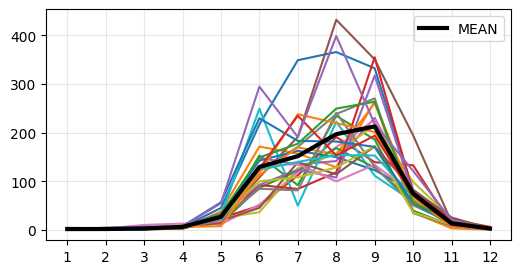

In [45]:
# Determne quintiles in order to select pollen data ranges
pivot_table = pd.pivot_table(view, values='value', index='month', columns='year', aggfunc=np.mean)

display(pivot_table)

plt.figure(figsize=(6,3))
# pivot_table.plot(kind='line', title=f"Specie id: {pol_id_wgt.value}");
plt.plot(pivot_table, '-')
plt.grid(alpha=.3)
plt.xticks(range(1,13));

specie_pivot_mean_sum = pivot_table.mean(axis=1)

plt.plot(specie_pivot_mean_sum, c="black", lw=3, label="MEAN")
plt.legend()
plt.show();

In [46]:
specie_pivot_mean_sum

month
1       2.118948
2       2.266009
3       3.238676
4       6.636118
5      27.250064
6     129.673426
7     151.919768
8     197.120627
9     212.981199
10     75.339762
11     14.049185
12      3.162565
dtype: float64

In [47]:
specie_thresh = np.percentile(specie_pivot_mean_sum, 25)
specie_thresh

3.2196484753503936

In [48]:
specie_months = np.where(specie_pivot_mean_sum > specie_thresh)[0] + 1
specie_months

array([ 3,  4,  5,  6,  7,  8,  9, 10, 11])

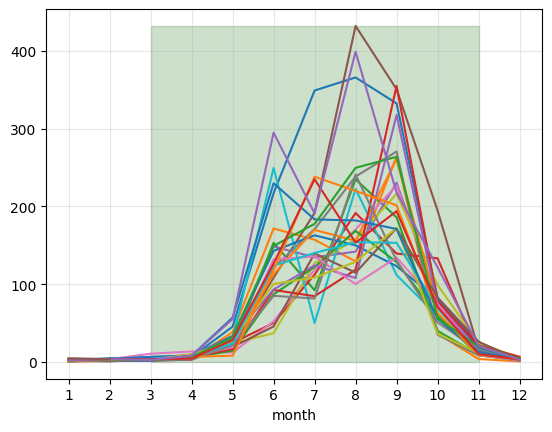

In [49]:
pivot_table = pd.pivot_table(view, values='value', index='month', columns='year', aggfunc=np.mean)
pivot_table.plot(kind='line', legend=None);
plt.grid(alpha=.3)
plt.xticks(range(1,13));
plt.fill_between(specie_months, pivot_table.max().max(), alpha=.2, color="darkgreen");

In [50]:
def highlighter(cell_value):
    if cell_value is True:
        return "background-color: lightgreen"
    else:
        return "color: gray"

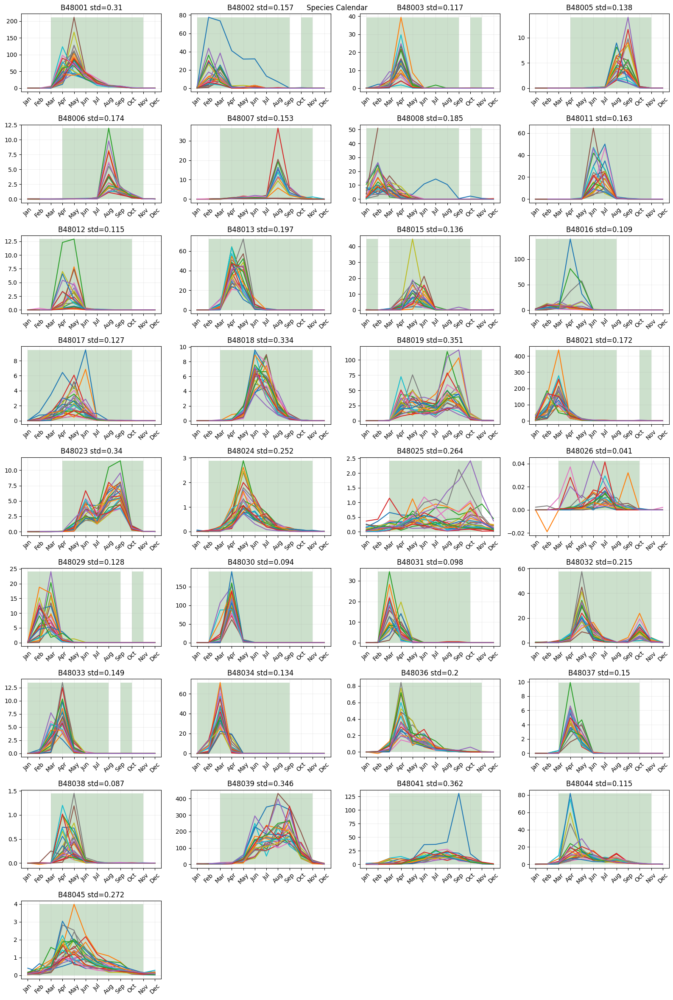

In [51]:
def make_varid_cal(view):
    # pivot over month/year
    pivot_table = pd.pivot_table(view, values='value', index='month', columns='year', aggfunc=np.mean)
    
    # define ranges
    specie_pivot_mean_sum = pivot_table.mean(axis=1)
    
    ### specie pollen thresh
    specie_thresh = np.percentile(specie_pivot_mean_sum[specie_pivot_mean_sum>0], 25)
    specie_thresh = specie_thresh if specie_thresh else specie_pivot_mean_sum.min()

    # retrieve specie calendar months
    specie_months = np.where(specie_pivot_mean_sum >= specie_thresh)[0]
    specie_months = specie_pivot_mean_sum.iloc[specie_months].index

    # store calendar
    species_calendar[pol_var_id] = (specie_pivot_mean_sum >= specie_thresh).values
    
    return pivot_table, specie_months

rows, cols = 9, 4
fig, axs = plt.subplots(rows, cols, figsize=(16,24), squeeze=False)
fig.suptitle("Species Calendar")
species_calendar = {}

for specie_n, (pol_var_id, view) in enumerate(poldat_df.groupby("variable_id")):
    view = view.sort_values("reftime").copy()
    
    # evaluate calendar
    pivot_table, specie_months = make_varid_cal(view)
    
    # display
    row_idx, col_idx = divmod(specie_n, cols)
    axs[row_idx, col_idx].plot(pivot_table)
    axs[row_idx, col_idx].set_title(f"{pol_var_id} std={np.round(view.value.mean()/view.value.std(),3)}")
    axs[row_idx, col_idx].set_xticks(range(1,13), labels=list(calendar.month_abbr)[1:], rotation=45);
    axs[row_idx, col_idx].grid(alpha=.2)

    for m in specie_months[specie_months < 11]:
        axs[row_idx, col_idx].fill_between([m,m+1], pivot_table.max().max(), alpha=.2, facecolor="darkgreen");

# Remove empty plot from subplot grid
for subpltn in range(specie_n+1, rows*cols): fig.delaxes(axs.flatten()[subpltn])
plt.tight_layout()
plt.show()

In [52]:
cal_1 = pd.DataFrame(species_calendar).T
cal_1.columns = list(map(lambda s: s.upper(), calendar.month_abbr[1:]))
display(cal_1.style.applymap(highlighter))

,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC
B48001,False,False,True,True,True,True,True,True,True,True,True,False
B48002,True,True,True,True,True,True,True,True,False,True,False,False
B48003,True,True,True,True,True,True,True,True,False,True,False,False
B48005,False,False,False,True,True,True,True,True,True,True,True,True
B48006,False,False,False,True,True,True,True,True,True,True,True,True
B48007,False,False,True,True,True,True,True,True,True,True,True,False
B48008,True,True,True,True,True,True,True,True,False,True,False,False
B48011,False,False,False,True,True,True,True,True,True,True,True,True
B48012,False,True,True,True,True,True,True,True,True,False,False,True
B48013,False,True,True,True,True,True,True,True,True,True,False,False


## 7.2 Creating calendar using rolling n-days average and bcode_soglie

Viene creata una finestratura di n giorni e raccolta la media.
Le medie vengono comparate al valore "basso" presente nei range dei b_code.
Il calendario viene infine creato filtrando i mesi con valori superiori alla soglia.

In [53]:
window_size_days = 5

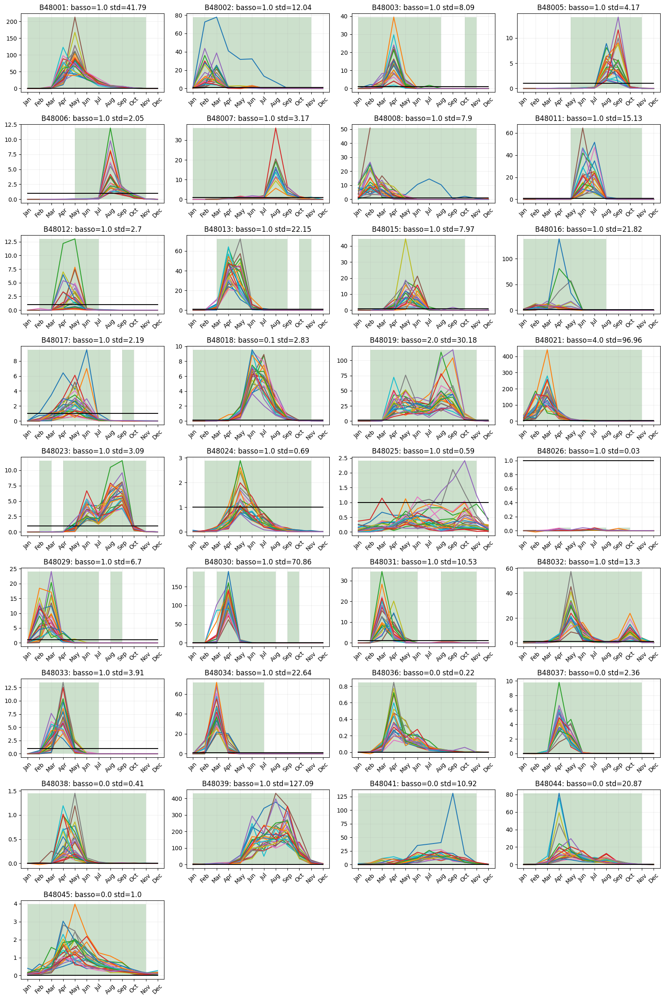

In [55]:
rows, cols = 9, 4
fig, axs = plt.subplots(rows, cols, figsize=(16,24), squeeze=False)
# fig.suptitle(f"Species Calendar - pol_value avg {window_size_days} days")

species_calendar = {}
for specie_n, (pol_var_id, view) in enumerate(poldat_df.groupby("variable_id")):
    view = view.sort_values(["reftime"]).copy()
    view = view.rolling(window_size_days).agg({"value": np.mean, "month": "max", "year": "max", "basso": "max"}).reset_index()

    # filter months with value greater than basso
    specie_months = np.sort(view[view.value > view.basso].month.unique())

    # store calendar
    species_calendar[pol_var_id] = [m in specie_months for m in range(1,13)]

    # display
    pivot_table = pd.pivot_table(view, values='value', index='month', columns='year', aggfunc=np.mean)
    
    row_idx, col_idx = divmod(specie_n, cols)
    axs[row_idx, col_idx].plot(pivot_table) #, ".-")
    axs[row_idx, col_idx].set_title(f"{pol_var_id}: basso={view.basso.max()} std={np.round(np.std(view.value),2)}") #": {','.join(map(str,specie_months))}")
    axs[row_idx, col_idx].set_xticks(range(1,13), labels=list(calendar.month_abbr)[1:], rotation=45);
    axs[row_idx, col_idx].grid(alpha=.2)

    for m in specie_months[specie_months < 11]:
        axs[row_idx, col_idx].fill_between([m,m+1], pivot_table.max().max(), alpha=.2, facecolor="darkgreen");
    
    # plot value basso
    axs[row_idx, col_idx].plot(range(1,13), [view.basso.max()]*12, c="black")

# Remove empty plot from subplot grid
for subpltn in range(specie_n+1, rows*cols): fig.delaxes(axs.flatten()[subpltn])
plt.tight_layout()
plt.show()

In [56]:
cal_2 = pd.DataFrame(species_calendar).T
cal_2.columns = list(map(lambda s: s.upper(), calendar.month_abbr[1:]))
display(cal_2.style.applymap(highlighter))

,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC
B48001,True,True,True,True,True,True,True,True,True,True,True,True
B48002,True,True,True,True,True,True,True,True,True,True,True,True
B48003,True,True,True,True,True,True,True,False,False,True,False,False
B48005,False,False,False,False,True,True,True,True,True,True,False,False
B48006,False,False,False,False,True,True,True,True,True,True,True,False
B48007,True,True,True,True,True,True,True,True,True,True,True,False
B48008,True,True,True,True,True,True,True,True,True,True,True,True
B48011,False,False,False,False,True,True,True,True,True,True,False,False
B48012,False,True,True,True,True,True,False,False,False,False,False,False
B48013,False,False,True,True,True,True,True,True,False,True,False,False


## 7.3 Creating calendar using rolling n-days average and bcode_soglie (polline > MEDIO / 2)

In [57]:
window_size_days = 5

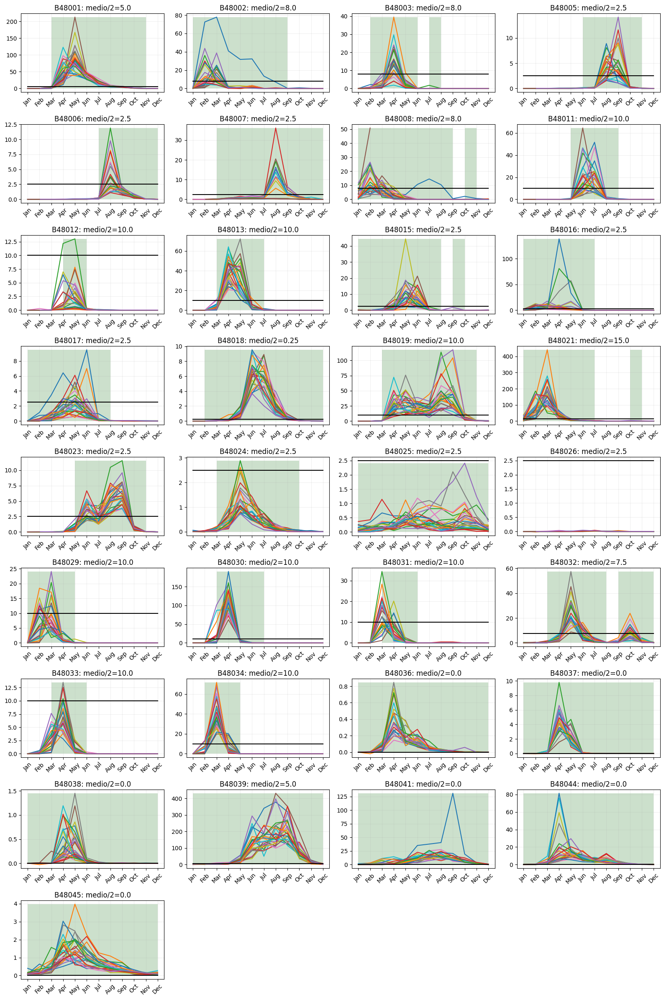

In [58]:
rows, cols = 9, 4
fig, axs = plt.subplots(rows, cols, figsize=(16,24), squeeze=False)
# fig.suptitle(f"Species Calendar - pol_value avg {window_size_days} days")

species_calendar = {}
for specie_n, (pol_var_id, view) in enumerate(poldat_df.groupby("variable_id")):
    view = view.sort_values("reftime").copy()
    view = view.rolling(window_size_days).agg({"value": np.mean, "month": "max", "year": "max", "medio": "max"}).reset_index()

    # filter months with value greater than basso
    specie_months = np.sort(view[view.value > (view.medio / 2)].month.unique())

    # store calendar
    species_calendar[pol_var_id] = [m in specie_months for m in range(1,13)]

    # display
    pivot_table = pd.pivot_table(view, values='value', index='month', columns='year', aggfunc=np.mean)
    
    row_idx, col_idx = divmod(specie_n, cols)
    axs[row_idx, col_idx].plot(pivot_table)
    axs[row_idx, col_idx].set_title(f"{pol_var_id}: medio/2={view.medio.max()/2}")
    axs[row_idx, col_idx].set_xticks(range(1,13), labels=list(calendar.month_abbr)[1:], rotation=45);
    axs[row_idx, col_idx].grid(alpha=.2)

    for m in specie_months[specie_months < 12]:
        axs[row_idx, col_idx].fill_between([m,m+1], pivot_table.max().max(), alpha=.2, facecolor="darkgreen");
    
    # plot value basso
    axs[row_idx, col_idx].plot(range(1,13), [view.medio.max()/2]*12, c="black")

# Remove empty plot from subplot grid
for subpltn in range(specie_n+1, rows*cols): fig.delaxes(axs.flatten()[subpltn])
plt.tight_layout()
plt.show()

In [59]:
cal_3 = pd.DataFrame(species_calendar).T
cal_3.columns = list(map(lambda s: s.upper(), calendar.month_abbr[1:]))
display(cal_3.style.applymap(highlighter))

,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC
B48001,False,False,True,True,True,True,True,True,True,True,False,False
B48002,True,True,True,True,True,True,True,True,False,False,False,False
B48003,False,True,True,True,True,False,True,False,False,False,False,False
B48005,False,False,False,False,False,True,True,True,True,True,False,False
B48006,False,False,False,False,False,False,True,True,True,True,True,False
B48007,False,False,True,True,True,True,True,True,True,True,True,False
B48008,True,True,True,True,True,True,True,True,False,True,False,False
B48011,False,False,False,False,True,True,True,True,False,False,False,False
B48012,False,False,False,True,True,False,False,False,False,False,False,False
B48013,False,False,True,True,True,True,False,False,False,False,False,False


## 7.4 Update calendar on BigQuery

In [60]:
for pol_id, pol_cal in cal_1.iterrows():
    query = f"UPDATE `arpae-prod-ml.SAMPLE_DATA.BCODE_SOGLIE` SET"
    
    for idx, (month, value) in enumerate(pol_cal.iteritems()):
        query += f" CAL_{idx+1:02d}_{month}={value},"
    
    query = query[:-1] + f" WHERE b_code=\"{pol_id}\";"
    
    print(query)
    #_run_query(bq_client, query)

UPDATE `arpae-prod-ml.SAMPLE_DATA.BCODE_SOGLIE` SET CAL_01_JAN=False, CAL_02_FEB=False, CAL_03_MAR=True, CAL_04_APR=True, CAL_05_MAY=True, CAL_06_JUN=True, CAL_07_JUL=True, CAL_08_AUG=True, CAL_09_SEP=True, CAL_10_OCT=True, CAL_11_NOV=True, CAL_12_DEC=False WHERE b_code="B48001";
UPDATE `arpae-prod-ml.SAMPLE_DATA.BCODE_SOGLIE` SET CAL_01_JAN=True, CAL_02_FEB=True, CAL_03_MAR=True, CAL_04_APR=True, CAL_05_MAY=True, CAL_06_JUN=True, CAL_07_JUL=True, CAL_08_AUG=True, CAL_09_SEP=False, CAL_10_OCT=True, CAL_11_NOV=False, CAL_12_DEC=False WHERE b_code="B48002";
UPDATE `arpae-prod-ml.SAMPLE_DATA.BCODE_SOGLIE` SET CAL_01_JAN=True, CAL_02_FEB=True, CAL_03_MAR=True, CAL_04_APR=True, CAL_05_MAY=True, CAL_06_JUN=True, CAL_07_JUL=True, CAL_08_AUG=True, CAL_09_SEP=False, CAL_10_OCT=True, CAL_11_NOV=False, CAL_12_DEC=False WHERE b_code="B48003";
UPDATE `arpae-prod-ml.SAMPLE_DATA.BCODE_SOGLIE` SET CAL_01_JAN=False, CAL_02_FEB=False, CAL_03_MAR=False, CAL_04_APR=True, CAL_05_MAY=True, CAL_06_JUN=True, 